In [4]:
from os import listdir
import cv2
from typing import List
import random
import numpy as np

In [5]:
%matplotlib inline
import matplotlib.pyplot as plt

In [6]:
import torch
from torch import optim, nn
from torch.utils.data import DataLoader, random_split
from torchvision.utils import make_grid
from torchvision import models, transforms, datasets

In [7]:
# Set device.
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

### CONFIG

In [8]:
# Hyperparameters.
learning_rate = 1e-3
batch_size = 32
num_epochs = 100
train_split = 0.7
image_size = 224

In [9]:
# Load data.
frames = "frames_100"
data_dir = f"../../data/WLASL/{frames}"

### Input labels with images

In [10]:
input_labels = listdir(data_dir)
input_labels[:5]

['accident', 'africa', 'all', 'apple', 'basketball']

In [11]:
def show_image(img):
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  plt.imshow(img)
  plt.show()
  
def imshow(img):
  img = img / 2 + 0.5 # unnormalize
  npimg = img.numpy() # convert to numpy objects
  plt.imshow(np.transpose(npimg, (1, 2, 0)))
  plt.show()

color


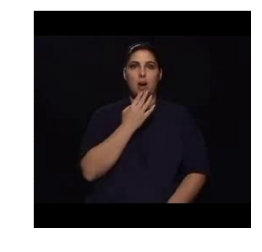

In [12]:
label = input_labels[random.randint(0, len(input_labels) - 1)]
label_images = listdir(data_dir + "/" + label)
label_images

print(label)

image = cv2.imread(data_dir + "/" + label + "/" + label_images[0])
show_image(image)


### Create dataloader for pytorch

In [29]:
def load_split_dataset(data_dir, train_split=0.7, batch_size=32, image_size=224):
    transform = transforms.Compose(
        [
            transforms.Resize(image_size),
            transforms.ToTensor(),
        ]
    )
    dataset = datasets.ImageFolder(data_dir, transform=transform)

    classes = dataset.classes
    split = int(train_split * len(dataset))

    train_set, test_set = random_split(dataset, [split, len(dataset) - split])
    train_loader = DataLoader(dataset=train_set, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(dataset=test_set, batch_size=batch_size, shuffle=True)

    return train_loader, test_loader, classes


In [30]:
train_loader, test_loader, classes = load_split_dataset(
    data_dir,
    train_split=train_split,
    batch_size=batch_size,
    image_size=image_size,
)

num_classes = len(classes)

print(len(train_loader))
print(len(test_loader))
print(train_loader.batch_size)


45
20
32


### Load pretrained resnet model

In [15]:
# Load pretrain model & modify it.
model = models.resnet34(pretrained=True)

In [16]:
for param in model.parameters():
    param.requires_grad = False

model.fc = nn.Sequential(
    nn.Linear(512, 512),
    nn.ReLU(),
    nn.Dropout(0.2),
    nn.Linear(512, num_classes),
    nn.LogSoftmax(dim=1),
)

In [41]:
# Loss and optimizer.
criterion = nn.NLLLoss()
optimizer = optim.Adam(model.fc.parameters(), lr=learning_rate)

model.to(device)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### Freeze model and train only last layer

In [42]:
def train():
    # Train network.
    costs = []

    for epoch in range(num_epochs):
        losses = []

        for batch_idx, (data, targets) in enumerate(train_loader):
            # Get data to cuda if possible.
            data = data.to(device)
            targets = targets.to(device)

            # forward.
            scores = model(data)
            loss = criterion(scores, targets)
            losses.append(loss.item())

            # backward.
            optimizer.zero_grad()
            loss.backward()

            # gradient descent or adam step.
            optimizer.step()

        cost = sum(losses) / len(losses)
        costs.append(cost)
        print(f"Cost at epoch {epoch + 1} is {cost:.5f}")

    return costs


costs = train()


Cost at epoch 0 is 4.67359
Cost at epoch 1 is 4.50854
Cost at epoch 2 is 4.37746
Cost at epoch 3 is 4.17692
Cost at epoch 4 is 4.01905
Cost at epoch 5 is 3.81726
Cost at epoch 6 is 3.62146
Cost at epoch 7 is 3.46116
Cost at epoch 8 is 3.29325
Cost at epoch 9 is 3.10809
Cost at epoch 10 is 2.97677
Cost at epoch 11 is 2.87692
Cost at epoch 12 is 2.76330
Cost at epoch 13 is 2.61543
Cost at epoch 14 is 2.56287
Cost at epoch 15 is 2.42768
Cost at epoch 16 is 2.30317
Cost at epoch 17 is 2.23217
Cost at epoch 18 is 2.14704
Cost at epoch 19 is 2.05336
Cost at epoch 20 is 1.99794
Cost at epoch 21 is 1.91492
Cost at epoch 22 is 1.88688
Cost at epoch 23 is 1.72350
Cost at epoch 24 is 1.69836
Cost at epoch 25 is 1.65884
Cost at epoch 26 is 1.54885
Cost at epoch 27 is 1.52923
Cost at epoch 28 is 1.51206
Cost at epoch 29 is 1.41318
Cost at epoch 30 is 1.33814
Cost at epoch 31 is 1.29034
Cost at epoch 32 is 1.28740
Cost at epoch 33 is 1.21678
Cost at epoch 34 is 1.22317
Cost at epoch 35 is 1.14167
Co

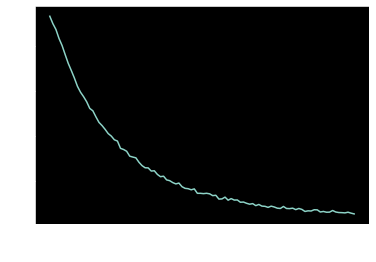

In [45]:
def plot_costs(costs):
    # Plot cost.
    plt.plot(costs)
    plt.ylabel("Cost")
    plt.xlabel("Epoch")
    plt.show()


plot_costs(costs)


### Save model

In [18]:
model_path = f"../../models/resnet_WLASL_{frames}.pth"

In [47]:
# Export model.
torch.save(model, model_path)


### Load saved model

In [19]:
# Import model for acc test.
model = torch.load(model_path)
model.to(device)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

### Test net

In [36]:
# Check accuracy on training & test to see how good our model predicts.
def check_accuracy(loader, model):
    num_correct = 0
    num_samples = 0
    model.eval()

    with torch.no_grad():
        for i, (x, y) in enumerate(loader):
            x = x.to(device=device)
            y = y.to(device=device)

            scores = model(x)
            _, predictions = scores.max(1)
            num_correct += (predictions == y).sum()
            num_samples += predictions.size(0)

            # Output both images to compare.
            print(f"Images for {i+1}")
            imshow(make_grid(x.cpu()))

            print(f"Predictions for batch {i+1} ")
            print([classes[int(i)] for i in predictions])

            print(f"Ground truth for batch {i+1}")
            print([classes[int(i)] for i in y])
            
            print("---------------------------------\n\n")

        print(
            f"Got {num_correct} / {num_samples} with accuracy {float(num_correct)/float(num_samples)*100:.2f}"
        )


Checking accuracy on Training Set
Images for 1


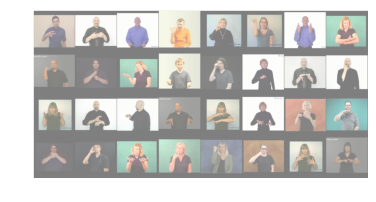

Predictions for batch 1 
['like', 'before', 'fish', 'hot', 'right', 'forget', 'family', 'son', 'last', 'year', 'right', 'can', 'africa', 'blue', 'work', 'pink', 'chair', 'study', 'need', 'last', 'chair', 'walk', 'letter', 'woman', 'dark', 'drink', 'want', 'who', 'black', 'chair', 'clothes', 'but']
Ground truth for batch 1
['like', 'before', 'many', 'hot', 'yes', 'forget', 'family', 'son', 'last', 'year', 'right', 'can', 'africa', 'thanksgiving', 'language', 'pink', 'clothes', 'hot', 'need', 'last', 'table', 'walk', 'letter', 'full', 'dark', 'drink', 'want', 'who', 'black', 'apple', 'clothes', 'but']
---------------------------------


Images for 2


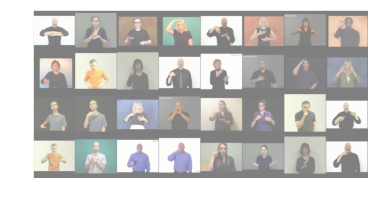

Predictions for batch 2 
['clothes', 'help', 'now', 'hat', 'like', 'enjoy', 'play', 'cow', 'bowling', 'shirt', 'need', 'yes', 'time', 'birthday', 'hat', 'corn', 'bowling', 'thin', 'shirt', 'later', 'graduate', 'play', 'eat', 'computer', 'can', 'help', 'tell', 'drink', 'eat', 'yes', 'paper', 'hearing']
Ground truth for batch 2
['table', 'help', 'full', 'hat', 'dance', 'enjoy', 'play', 'cow', 'bowling', 'shirt', 'need', 'yes', 'thanksgiving', 'birthday', 'hat', 'corn', 'short', 'thin', 'shirt', 'later', 'graduate', 'before', 'who', 'computer', 'can', 'help', 'short', 'drink', 'deaf', 'what', 'paper', 'hearing']
---------------------------------


Images for 3


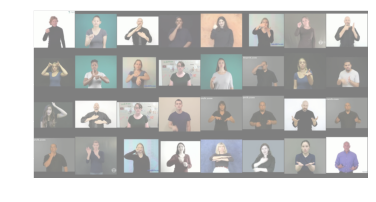

Predictions for batch 3 
['yes', 'pizza', 'last', 'who', 'black', 'letter', 'blue', 'paint', 'cow', 'later', 'time', 'go', 'thursday', 'hat', 'letter', 'what', 'hat', 'enjoy', 'finish', 'no', 'walk', 'give', 'many', 'what', 'color', 'paint', 'corn', 'year', 'cheat', 'son', 'book', 'now']
Ground truth for batch 3
['yes', 'pizza', 'all', 'orange', 'black', 'letter', 'yes', 'paint', 'cow', 'later', 'time', 'go', 'thursday', 'black', 'bowling', 'what', 'hat', 'enjoy', 'finish', 'no', 'walk', 'give', 'many', 'what', 'color', 'computer', 'corn', 'year', 'table', 'son', 'book', 'now']
---------------------------------


Images for 4


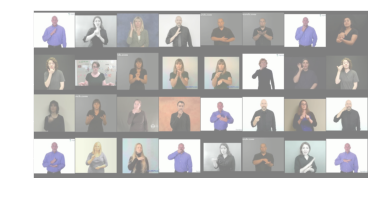

Predictions for batch 4 
['tell', 'tall', 'family', 'fine', 'son', 'family', 'color', 'doctor', 'accident', 'language', 'work', 'book', 'book', 'full', 'bed', 'white', 'wrong', 'many', 'eat', 'eat', 'letter', 'fish', 'but', 'apple', 'cook', 'no', 'go', 'hearing', 'tell', 'doctor', 'paper', 'woman']
Ground truth for batch 4
['fine', 'tall', 'blue', 'fine', 'son', 'book', 'color', 'doctor', 'accident', 'language', 'work', 'book', 'book', 'full', 'mother', 'white', 'wrong', 'many', 'eat', 'eat', 'letter', 'dog', 'but', 'apple', 'cook', 'no', 'woman', 'pizza', 'tell', 'doctor', 'paper', 'woman']
---------------------------------


Images for 5


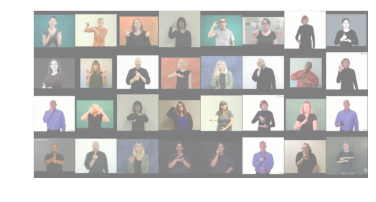

Predictions for batch 5 
['pull', 'go', 'many', 'cousin', 'cousin', 'drink', 'shirt', 'blue', 'help', 'play', 'change', 'man', 'later', 'bed', 'enjoy', 'go', 'accident', 'dark', 'table', 'purple', 'give', 'study', 'change', 'fish', 'right', 'tell', 'family', 'cook', 'candy', 'right', 'who', 'chair']
Ground truth for batch 5
['pull', 'go', 'many', 'cousin', 'cousin', 'all', 'dog', 'help', 'help', 'computer', 'change', 'man', 'later', 'bed', 'enjoy', 'go', 'accident', 'dark', 'table', 'hat', 'give', 'study', 'woman', 'fish', 'right', 'tell', 'same', 'cook', 'kiss', 'right', 'who', 'table']
---------------------------------


Images for 6


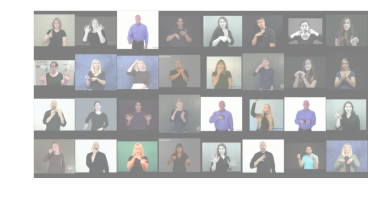

Predictions for batch 6 
['thanksgiving', 'dark', 'dog', 'woman', 'later', 'kiss', 'corn', 'fish', 'finish', 'go', 'hat', 'meet', 'accident', 'pizza', 'kiss', 'change', 'kiss', 'bowling', 'finish', 'study', 'white', 'tall', 'chair', 'yes', 'hearing', 'wrong', 'doctor', 'decide', 'basketball', 'fine', 'language', 'decide']
Ground truth for batch 6
['thanksgiving', 'dark', 'dog', 'what', 'later', 'fine', 'corn', 'hot', 'play', 'go', 'hat', 'meet', 'accident', 'pizza', 'kiss', 'change', 'kiss', 'bowling', 'finish', 'study', 'white', 'tall', 'same', 'yes', 'apple', 'wrong', 'doctor', 'decide', 'finish', 'woman', 'language', 'walk']
---------------------------------


Images for 7


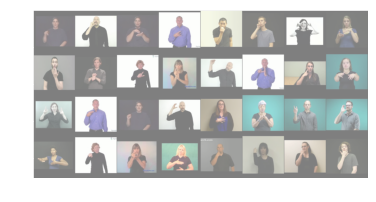

Predictions for batch 7 
['purple', 'drink', 'study', 'like', 'eat', 'bird', 'cow', 'kiss', 'color', 'work', 'all', 'time', 'forget', 'meet', 'candy', 'walk', 'basketball', 'thursday', 'yes', 'tall', 'white', 'accident', 'later', 'drink', 'walk', 'yes', 'graduate', 'cook', 'who', 'black', 'eat', 'accident']
Ground truth for batch 7
['purple', 'drink', 'study', 'like', 'eat', 'bird', 'cow', 'study', 'color', 'work', 'all', 'time', 'tall', 'later', 'candy', 'walk', 'basketball', 'thursday', 'yes', 'cousin', 'white', 'accident', 'later', 'drink', 'walk', 'yes', 'graduate', 'enjoy', 'who', 'black', 'eat', 'accident']
---------------------------------


Images for 8


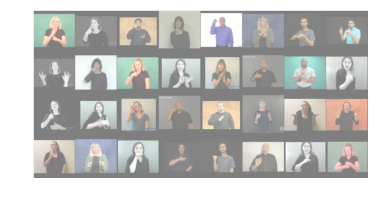

Predictions for batch 8 
['right', 'who', 'chair', 'pink', 'black', 'purple', 'pull', 'language', 'computer', 'deaf', 'thin', 'family', 'book', 'fish', 'year', 'tell', 'time', 'all', 'cow', 'deaf', 'woman', 'before', 'shirt', 'black', 'same', 'cook', 'bird', 'enjoy', 'before', 'hot', 'thanksgiving', 'white']
Ground truth for batch 8
['right', 'who', 'secretary', 'pink', 'black', 'same', 'pull', 'language', 'computer', 'bird', 'thin', 'family', 'book', 'fish', 'year', 'tell', 'eat', 'fine', 'cow', 'deaf', 'woman', 'before', 'what', 'accident', 'pink', 'decide', 'bird', 'enjoy', 'before', 'but', 'thanksgiving', 'year']
---------------------------------


Images for 9


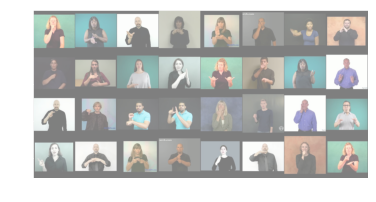

Predictions for batch 9 
['orange', 'doctor', 'africa', 'short', 'book', 'eat', 'purple', 'chair', 'hot', 'son', 'thursday', 'paint', 'now', 'right', 'dog', 'want', 'but', 'purple', 'work', 'computer', 'eat', 'short', 'mother', 'decide', 'dog', 'decide', 'table', 'help', 'blue', 'full', 'orange', 'medicine']
Ground truth for batch 9
['orange', 'doctor', 'africa', 'short', 'book', 'eat', 'hot', 'city', 'white', 'enjoy', 'thursday', 'paint', 'now', 'right', 'dog', 'basketball', 'pizza', 'purple', 'work', 'later', 'color', 'dog', 'mother', 'decide', 'dog', 'birthday', 'clothes', 'year', 'blue', 'full', 'orange', 'medicine']
---------------------------------


Images for 10


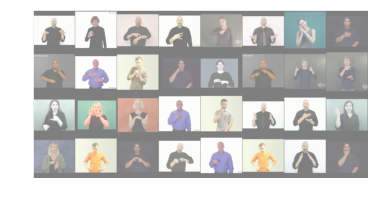

Predictions for batch 10 
['language', 'no', 'time', 'clothes', 'man', 'yes', 'son', 'woman', 'fine', 'enjoy', 'help', 'apple', 'chair', 'short', 'jacket', 'thanksgiving', 'last', 'but', 'doctor', 'white', 'change', 'finish', 'birthday', 'yes', 'year', 'jacket', 'chair', 'pull', 'purple', 'jacket', 'city', 'who']
Ground truth for batch 10
['language', 'no', 'time', 'like', 'man', 'what', 'bed', 'fish', 'fine', 'enjoy', 'help', 'deaf', 'chair', 'short', 'jacket', 'graduate', 'last', 'go', 'doctor', 'white', 'deaf', 'finish', 'cook', 'before', 'time', 'jacket', 'chair', 'pull', 'purple', 'jacket', 'city', 'wrong']
---------------------------------


Images for 11


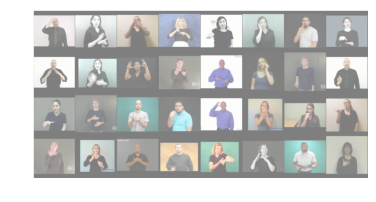

Predictions for batch 11 
['forget', 'school', 'city', 'graduate', 'hearing', 'bed', 'deaf', 'book', 'city', 'give', 'basketball', 'secretary', 'walk', 'kiss', 'bowling', 'fish', 'hot', 'enjoy', 'help', 'who', 'tall', 'change', 'eat', 'same', 'color', 'play', 'how', 'cool', 'time', 'paint', 'now', 'birthday']
Ground truth for batch 11
['forget', 'school', 'city', 'chair', 'cow', 'bed', 'deaf', 'graduate', 'city', 'birthday', 'basketball', 'secretary', 'walk', 'kiss', 'bowling', 'fish', 'hot', 'enjoy', 'help', 'who', 'cousin', 'change', 'eat', 'same', 'color', 'play', 'how', 'who', 'time', 'city', 'what', 'birthday']
---------------------------------


Images for 12


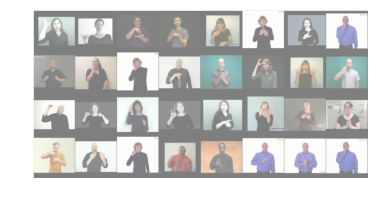

Predictions for batch 12 
['hat', 'same', 'dance', 'dance', 'clothes', 'go', 'all', 'eat', 'play', 'eat', 'bed', 'hot', 'book', 'computer', 'accident', 'candy', 'tall', 'jacket', 'decide', 'pizza', 'enjoy', 'paint', 'how', 'candy', 'medicine', 'thanksgiving', 'deaf', 'go', 'africa', 'thanksgiving', 'how', 'africa']
Ground truth for batch 12
['computer', 'same', 'dance', 'pull', 'clothes', 'go', 'all', 'eat', 'play', 'color', 'bed', 'hot', 'book', 'computer', 'accident', 'candy', 'tall', 'jacket', 'decide', 'pizza', 'full', 'paint', 'how', 'book', 'medicine', 'thanksgiving', 'deaf', 'play', 'africa', 'thanksgiving', 'year', 'africa']
---------------------------------


Images for 13


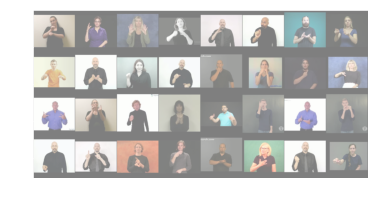

Predictions for batch 13 
['work', 'candy', 'finish', 'drink', 'man', 'but', 'medicine', 'go', 'can', 'book', 'yes', 'accident', 'wrong', 'meet', 'color', 'bowling', 'shirt', 'meet', 'go', 'book', 'language', 'forget', 'secretary', 'kiss', 'africa', 'go', 'change', 'thursday', 'cook', 'birthday', 'blue', 'purple']
Ground truth for batch 13
['work', 'blue', 'finish', 'drink', 'man', 'but', 'medicine', 'go', 'can', 'book', 'yes', 'accident', 'wrong', 'meet', 'tell', 'bowling', 'accident', 'meet', 'go', 'book', 'language', 'forget', 'secretary', 'kiss', 'africa', 'go', 'change', 'thursday', 'cook', 'birthday', 'all', 'give']
---------------------------------


Images for 14


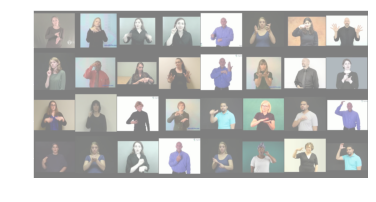

Predictions for batch 14 
['doctor', 'cheat', 'later', 'deaf', 'fish', 'basketball', 'purple', 'finish', 'deaf', 'black', 'time', 'white', 'paint', 'book', 'like', 'help', 'clothes', 'candy', 'shirt', 'medicine', 'later', 'cook', 'thanksgiving', 'tall', 'thursday', 'change', 'work', 'tell', 'secretary', 'apple', 'purple', 'computer']
Ground truth for batch 14
['doctor', 'cheat', 'clothes', 'deaf', 'work', 'basketball', 'purple', 'finish', 'deaf', 'black', 'time', 'finish', 'paint', 'book', 'like', 'graduate', 'clothes', 'candy', 'shirt', 'medicine', 'later', 'cook', 'thanksgiving', 'tall', 'thursday', 'change', 'work', 'tell', 'secretary', 'apple', 'purple', 'computer']
---------------------------------


Images for 15


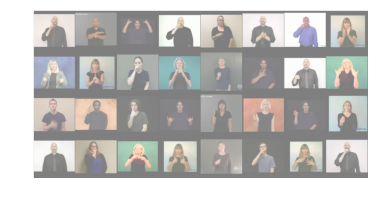

Predictions for batch 15 
['brown', 'full', 'cow', 'bird', 'orange', 'fine', 'tell', 'book', 'can', 'time', 'bird', 'city', 'africa', 'woman', 'need', 'study', 'dog', 'cousin', 'accident', 'now', 'blue', 'dog', 'africa', 'white', 'need', 'wrong', 'chair', 'jacket', 'white', 'corn', 'clothes', 'orange']
Ground truth for batch 15
['deaf', 'full', 'cow', 'bird', 'white', 'book', 'hearing', 'book', 'can', 'doctor', 'orange', 'city', 'africa', 'birthday', 'need', 'cool', 'color', 'cousin', 'tell', 'now', 'blue', 'dog', 'africa', 'white', 'want', 'wrong', 'short', 'jacket', 'white', 'corn', 'clothes', 'orange']
---------------------------------


Images for 16


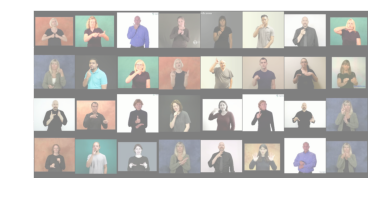

Predictions for batch 16 
['jacket', 'letter', 'tell', 'work', 'man', 'pizza', 'tell', 'full', 'no', 'pink', 'corn', 'family', 'cow', 'yes', 'walk', 'table', 'secretary', 'work', 'go', 'who', 'pizza', 'but', 'clothes', 'tall', 'thanksgiving', 'mother', 'language', 'school', 'woman', 'computer', 'time', 'accident']
Ground truth for batch 16
['jacket', 'letter', 'wrong', 'how', 'africa', 'hearing', 'tell', 'full', 'thin', 'pink', 'corn', 'family', 'cow', 'yes', 'walk', 'table', 'secretary', 'go', 'help', 'who', 'pizza', 'but', 'clothes', 'tall', 'last', 'mother', 'language', 'school', 'woman', 'computer', 'time', 'accident']
---------------------------------


Images for 17


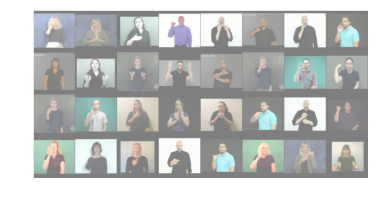

Predictions for batch 17 
['bird', 'jacket', 'enjoy', 'last', 'kiss', 'yes', 'mother', 'mother', 'no', 'many', 'now', 'dark', 'enjoy', 'forget', 'drink', 'hot', 'africa', 'mother', 'woman', 'tall', 'how', 'cool', 'work', 'later', 'mother', 'hearing', 'birthday', 'give', 'cool', 'brown', 'last', 'chair']
Ground truth for batch 17
['bird', 'jacket', 'enjoy', 'last', 'kiss', 'thursday', 'mother', 'mother', 'need', 'many', 'want', 'dark', 'before', 'thin', 'drink', 'black', 'thursday', 'candy', 'birthday', 'tall', 'how', 'cool', 'work', 'before', 'mother', 'drink', 'birthday', 'give', 'before', 'brown', 'last', 'chair']
---------------------------------


Images for 18


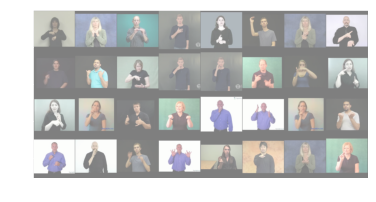

Predictions for batch 18 
['chair', 'birthday', 'kiss', 'thanksgiving', 'right', 'tall', 'work', 'medicine', 'pizza', 'last', 'study', 'apple', 'cousin', 'man', 'paint', 'hot', 'later', 'need', 'play', 'can', 'orange', 'black', 'who', 'want', 'last', 'mother', 'decide', 'computer', 'dog', 'same', 'work', 'no']
Ground truth for batch 18
['time', 'meet', 'kiss', 'birthday', 'right', 'tall', 'work', 'doctor', 'pizza', 'cool', 'study', 'apple', 'cousin', 'man', 'paint', 'cheat', 'later', 'need', 'play', 'can', 'orange', 'black', 'who', 'want', 'last', 'mother', 'decide', 'computer', 'dog', 'same', 'graduate', 'no']
---------------------------------


Images for 19


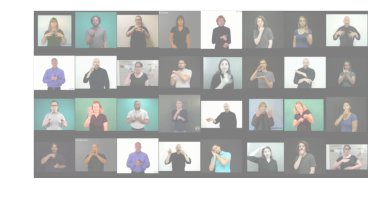

Predictions for batch 19 
['clothes', 'thursday', 'table', 'no', 'thursday', 'accident', 'kiss', 'clothes', 'how', 'deaf', 'deaf', 'cheat', 'hot', 'school', 'paper', 'meet', 'decide', 'mother', 'all', 'all', 'give', 'many', 'walk', 'orange', 'time', 'later', 'help', 'city', 'bed', 'hat', 'accident', 'enjoy']
Ground truth for batch 19
['clothes', 'thin', 'chair', 'no', 'doctor', 'accident', 'right', 'clothes', 'how', 'deaf', 'deaf', 'cheat', 'birthday', 'school', 'cheat', 'meet', 'decide', 'africa', 'all', 'fish', 'give', 'many', 'pull', 'orange', 'thin', 'later', 'help', 'computer', 'bed', 'hat', 'wrong', 'enjoy']
---------------------------------


Images for 20


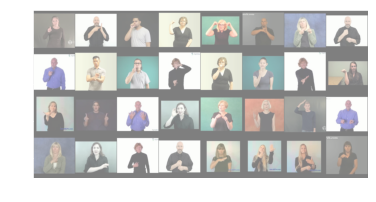

Predictions for batch 20 
['need', 'basketball', 'bird', 'apple', 'cow', 'paint', 'candy', 'year', 'tell', 'work', 'cool', 'thin', 'orange', 'pink', 'finish', 'walk', 'like', 'blue', 'finish', 'drink', 'letter', 'blue', 'hat', 'same', 'woman', 'computer', 'shirt', 'year', 'clothes', 'thanksgiving', 'fine', 'blue']
Ground truth for batch 20
['need', 'paint', 'bird', 'black', 'cow', 'paint', 'pull', 'year', 'tell', 'work', 'cool', 'thin', 'orange', 'pink', 'finish', 'forget', 'like', 'language', 'finish', 'drink', 'letter', 'blue', 'hat', 'same', 'woman', 'computer', 'shirt', 'year', 'clothes', 'thanksgiving', 'fine', 'yes']
---------------------------------


Images for 21


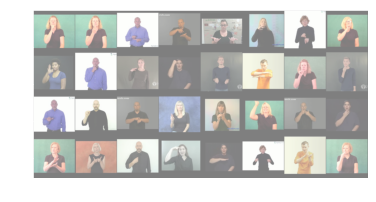

Predictions for batch 21 
['orange', 'pink', 'chair', 'study', 'now', 'cousin', 'go', 'bird', 'purple', 'who', 'shirt', 'hat', 'can', 'table', 'no', 'pink', 'medicine', 'no', 'same', 'pizza', 'book', 'forget', 'table', 'color', 'paper', 'how', 'tell', 'black', 'man', 'walk', 'medicine', 'thanksgiving']
Ground truth for batch 21
['orange', 'pink', 'chair', 'study', 'now', 'cousin', 'go', 'bird', 'man', 'who', 'shirt', 'black', 'can', 'table', 'who', 'pink', 'same', 'no', 'time', 'right', 'book', 'forget', 'accident', 'color', 'paper', 'how', 'white', 'black', 'man', 'accident', 'medicine', 'thanksgiving']
---------------------------------


Images for 22


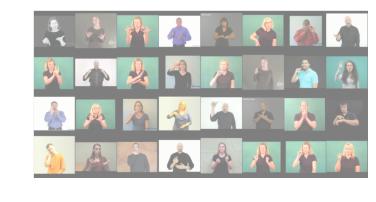

Predictions for batch 22 
['what', 'want', 'many', 'cook', 'pull', 'bowling', 'city', 'bowling', 'want', 'decide', 'paper', 'later', 'deaf', 'blue', 'candy', 'tall', 'meet', 'want', 'apple', 'hat', 'forget', 'all', 'meet', 'time', 'bed', 'want', 'wrong', 'birthday', 'change', 'play', 'no', 'dog']
Ground truth for batch 22
['what', 'want', 'many', 'cook', 'pull', 'bowling', 'city', 'bowling', 'meet', 'jacket', 'paper', 'later', 'deaf', 'blue', 'cool', 'tall', 'meet', 'dark', 'apple', 'need', 'cow', 'all', 'tall', 'time', 'bed', 'want', 'wrong', 'birthday', 'change', 'play', 'no', 'dog']
---------------------------------


Images for 23


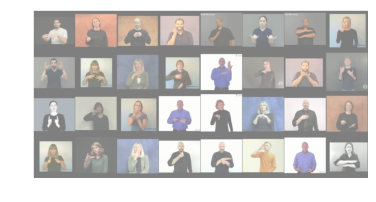

Predictions for batch 23 
['cheat', 'bed', 'accident', 'candy', 'cool', 'now', 'table', 'pink', 'basketball', 'clothes', 'man', 'medicine', 'paint', 'chair', 'help', 'thanksgiving', 'meet', 'apple', 'school', 'give', 'no', 'cheat', 'white', 'dance', 'table', 'give', 'candy', 'africa', 'full', 'drink', 'now', 'table']
Ground truth for batch 23
['cheat', 'bowling', 'accident', 'candy', 'cool', 'now', 'table', 'pink', 'basketball', 'clothes', 'man', 'medicine', 'paint', 'man', 'help', 'thanksgiving', 'meet', 'apple', 'school', 'give', 'yes', 'cheat', 'white', 'dance', 'table', 'give', 'candy', 'africa', 'full', 'drink', 'now', 'table']
---------------------------------


Images for 24


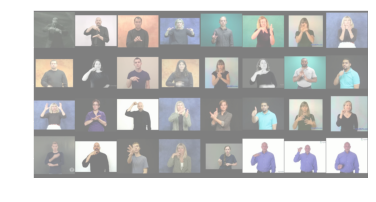

Predictions for batch 24 
['how', 'full', 'fine', 'language', 'thin', 'like', 'book', 'book', 'woman', 'apple', 'no', 'candy', 'time', 'hearing', 'tall', 'cool', 'hat', 'school', 'cow', 'paint', 'finish', 'later', 'clothes', 'deaf', 'son', 'hearing', 'finish', 'mother', 'short', 'shirt', 'last', 'short']
Ground truth for batch 24
['how', 'dance', 'hot', 'language', 'bowling', 'paint', 'book', 'book', 'white', 'apple', 'purple', 'candy', 'time', 'hearing', 'tall', 'woman', 'basketball', 'school', 'cow', 'paint', 'meet', 'later', 'clothes', 'deaf', 'son', 'hearing', 'finish', 'hearing', 'pull', 'shirt', 'last', 'short']
---------------------------------


Images for 25


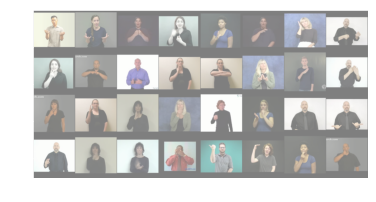

Predictions for batch 25 
['want', 'language', 'accident', 'letter', 'purple', 'hot', 'bed', 'pull', 'pink', 'chair', 'fish', 'brown', 'table', 'cook', 'fine', 'all', 'pink', 'black', 'brown', 'drink', 'no', 'paper', 'bed', 'now', 'later', 'orange', 'graduate', 'dark', 'forget', 'africa', 'change', 'drink']
Ground truth for batch 25
['want', 'many', 'accident', 'letter', 'woman', 'hot', 'bed', 'pull', 'pink', 'chair', 'fish', 'brown', 'table', 'how', 'fine', 'all', 'pink', 'blue', 'brown', 'eat', 'no', 'secretary', 'bed', 'now', 'later', 'orange', 'graduate', 'dark', 'forget', 'tall', 'candy', 'drink']
---------------------------------


Images for 26


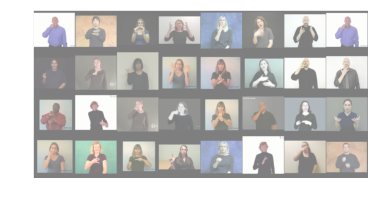

Predictions for batch 26 
['tell', 'school', 'language', 'basketball', 'pink', 'hot', 'secretary', 'candy', 'dog', 'woman', 'before', 'finish', 'graduate', 'enjoy', 'drink', 'wrong', 'work', 'no', 'hearing', 'hearing', 'book', 'who', 'short', 'blue', 'eat', 'like', 'clothes', 'now', 'africa', 'go', 'drink', 'year']
Ground truth for batch 26
['tell', 'school', 'kiss', 'basketball', 'pink', 'hot', 'secretary', 'candy', 'dog', 'woman', 'before', 'finish', 'graduate', 'enjoy', 'drink', 'birthday', 'work', 'pull', 'bird', 'hearing', 'book', 'orange', 'short', 'want', 'eat', 'like', 'chair', 'all', 'africa', 'cool', 'man', 'year']
---------------------------------


Images for 27


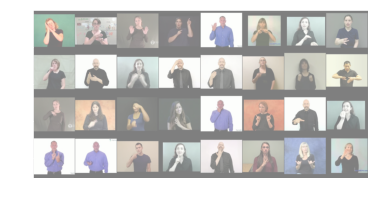

Predictions for batch 27 
['bed', 'cook', 'computer', 'go', 'last', 'chair', 'doctor', 'like', 'corn', 'fish', 'accident', 'black', 'blue', 'change', 'family', 'want', 'shirt', 'thursday', 'thin', 'fish', 'accident', 'but', 'bowling', 'eat', 'meet', 'bowling', 'hearing', 'deaf', 'color', 'eat', 'now', 'fine']
Ground truth for batch 27
['bed', 'cook', 'finish', 'go', 'last', 'chair', 'doctor', 'like', 'bird', 'fish', 'accident', 'black', 'blue', 'purple', 'many', 'walk', 'shirt', 'thursday', 'thin', 'fine', 'wrong', 'but', 'same', 'eat', 'meet', 'bowling', 'hearing', 'deaf', 'color', 'fine', 'now', 'brown']
---------------------------------


Images for 28


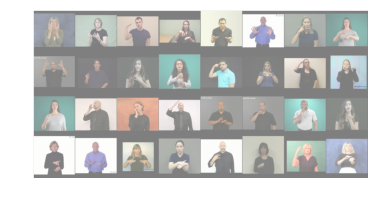

Predictions for batch 28 
['family', 'family', 'black', 'dance', 'what', 'dark', 'apple', 'deaf', 'later', 'no', 'fish', 'walk', 'black', 'pull', 'hat', 'pull', 'thursday', 'drink', 'bed', 'hat', 'medicine', 'bird', 'who', 'color', 'give', 'want', 'clothes', 'school', 'shirt', 'white', 'cousin', 'cheat']
Ground truth for batch 28
['family', 'family', 'black', 'dance', 'what', 'dark', 'apple', 'time', 'basketball', 'no', 'birthday', 'year', 'black', 'pull', 'hat', 'corn', 'thursday', 'drink', 'bed', 'hat', 'medicine', 'bird', 'who', 'color', 'doctor', 'want', 'clothes', 'school', 'shirt', 'white', 'cousin', 'doctor']
---------------------------------


Images for 29


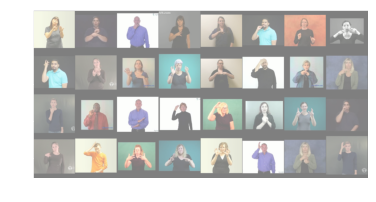

Predictions for batch 29 
['paint', 'work', 'hot', 'dog', 'thanksgiving', 'cool', 'fish', 'dark', 'computer', 'family', 'walk', 'basketball', 'jacket', 'forget', 'short', 'thursday', 'color', 'no', 'paper', 'full', 'cousin', 'change', 'decide', 'bird', 'purple', 'hat', 'accident', 'apple', 'dark', 'computer', 'year', 'cousin']
Ground truth for batch 29
['paint', 'work', 'hot', 'woman', 'thanksgiving', 'cool', 'play', 'corn', 'forget', 'family', 'walk', 'basketball', 'jacket', 'forget', 'short', 'thursday', 'color', 'no', 'paper', 'go', 'cousin', 'change', 'basketball', 'bird', 'purple', 'hat', 'accident', 'short', 'dark', 'computer', 'year', 'cousin']
---------------------------------


Images for 30


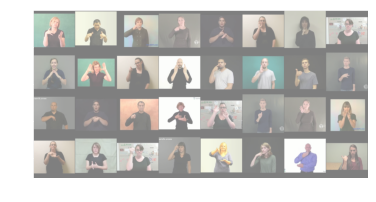

Predictions for batch 30 
['study', 'want', 'drink', 'hearing', 'doctor', 'drink', 'deaf', 'eat', 'city', 'basketball', 'shirt', 'meet', 'hearing', 'brown', 'white', 'thin', 'hot', 'time', 'need', 'basketball', 'basketball', 'pizza', 'mother', 'book', 'dance', 'fish', 'forget', 'cow', 'dance', 'hearing', 'son', 'before']
Ground truth for batch 30
['study', 'play', 'drink', 'hearing', 'doctor', 'drink', 'deaf', 'eat', 'city', 'basketball', 'need', 'family', 'hearing', 'brown', 'fish', 'like', 'thanksgiving', 'time', 'need', 'all', 'basketball', 'pizza', 'mother', 'book', 'dance', 'fish', 'forget', 'hat', 'dance', 'hearing', 'son', 'before']
---------------------------------


Images for 31


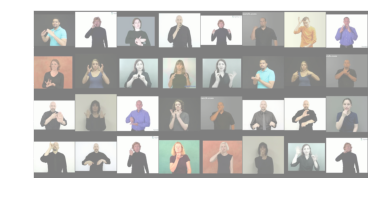

Predictions for batch 31 
['city', 'drink', 'before', 'mother', 'jacket', 'before', 'hat', 'city', 'medicine', 'basketball', 'change', 'shirt', 'family', 'help', 'computer', 'help', 'year', 'cool', 'shirt', 'accident', 'who', 'can', 'graduate', 'orange', 'drink', 'walk', 'go', 'purple', 'apple', 'orange', 'family', 'full']
Ground truth for batch 31
['city', 'drink', 'before', 'mother', 'jacket', 'before', 'computer', 'city', 'medicine', 'basketball', 'but', 'shirt', 'family', 'help', 'jacket', 'help', 'before', 'cool', 'dance', 'family', 'orange', 'can', 'computer', 'eat', 'drink', 'walk', 'go', 'purple', 'apple', 'orange', 'decide', 'full']
---------------------------------


Images for 32


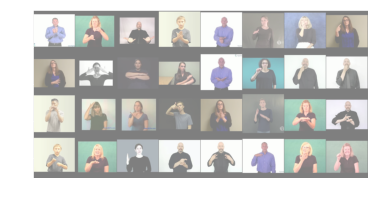

Predictions for batch 32 
['change', 'last', 'now', 'all', 'full', 'hot', 'orange', 'purple', 'woman', 'dark', 'table', 'son', 'give', 'no', 'cool', 'eat', 'kiss', 'hat', 'thin', 'pizza', 'book', 'bed', 'school', 'medicine', 'all', 'fish', 'blue', 'graduate', 'shirt', 'shirt', 'color', 'yes']
Ground truth for batch 32
['change', 'last', 'now', 'all', 'full', 'hot', 'orange', 'purple', 'woman', 'dark', 'table', 'computer', 'book', 'no', 'cool', 'eat', 'kiss', 'hat', 'same', 'pizza', 'book', 'bed', 'school', 'medicine', 'pull', 'hot', 'blue', 'graduate', 'shirt', 'shirt', 'color', 'yes']
---------------------------------


Images for 33


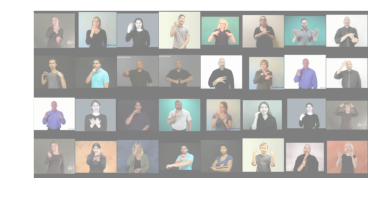

Predictions for batch 33 
['doctor', 'color', 'cousin', 'kiss', 'clothes', 'tall', 'finish', 'doctor', 'shirt', 'candy', 'purple', 'jacket', 'like', 'book', 'pizza', 'forget', 'language', 'book', 'woman', 'who', 'decide', 'kiss', 'give', 'basketball', 'dog', 'mother', 'son', 'computer', 'doctor', 'many', 'who', 'cheat']
Ground truth for batch 33
['doctor', 'color', 'cousin', 'kiss', 'clothes', 'school', 'finish', 'doctor', 'shirt', 'corn', 'purple', 'jacket', 'like', 'medicine', 'pizza', 'forget', 'language', 'book', 'woman', 'who', 'decide', 'kiss', 'give', 'basketball', 'dog', 'paper', 'son', 'computer', 'son', 'many', 'finish', 'basketball']
---------------------------------


Images for 34


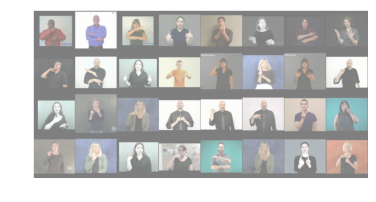

Predictions for batch 34 
['year', 'cheat', 'chair', 'play', 'meet', 'what', 'son', 'many', 'drink', 'son', 'play', 'can', 'cow', 'fish', 'computer', 'pull', 'cook', 'thin', 'purple', 'year', 'before', 'thanksgiving', 'brown', 'cool', 'need', 'brown', 'last', 'hearing', 'cheat', 'eat', 'meet', 'letter']
Ground truth for batch 34
['year', 'cheat', 'table', 'play', 'meet', 'what', 'son', 'many', 'full', 'cheat', 'play', 'can', 'cow', 'fish', 'computer', 'all', 'cook', 'thin', 'purple', 'how', 'before', 'purple', 'pink', 'cool', 'no', 'brown', 'last', 'hearing', 'cheat', 'eat', 'meet', 'letter']
---------------------------------


Images for 35


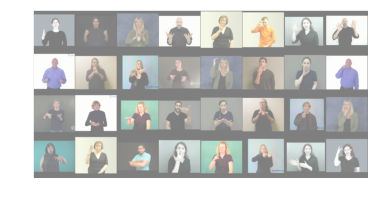

Predictions for batch 35 
['blue', 'many', 'medicine', 'basketball', 'pink', 'hat', 'man', 'computer', 'can', 'year', 'before', 'walk', 'tall', 'color', 'brown', 'corn', 'doctor', 'walk', 'short', 'finish', 'all', 'but', 'pizza', 'wrong', 'bowling', 'pink', 'son', 'hot', 'need', 'pull', 'fish', 'cousin']
Ground truth for batch 35
['blue', 'many', 'medicine', 'many', 'pink', 'hat', 'man', 'computer', 'can', 'year', 'before', 'walk', 'tall', 'color', 'brown', 'corn', 'all', 'bed', 'short', 'fish', 'all', 'but', 'pizza', 'wrong', 'bowling', 'blue', 'son', 'hot', 'need', 'pull', 'fish', 'forget']
---------------------------------


Images for 36


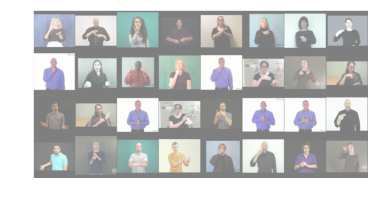

Predictions for batch 36 
['cheat', 'forget', 'who', 'jacket', 'help', 'cousin', 'doctor', 'thursday', 'who', 'now', 'but', 'no', 'kiss', 'study', 'shirt', 'study', 'bowling', 'paint', 'help', 'computer', 'dance', 'help', 'how', 'thursday', 'enjoy', 'medicine', 'son', 'go', 'orange', 'candy', 'how', 'cow']
Ground truth for batch 36
['secretary', 'chair', 'who', 'jacket', 'paper', 'cousin', 'change', 'thursday', 'who', 'can', 'but', 'wrong', 'kiss', 'study', 'shirt', 'study', 'now', 'paint', 'help', 'computer', 'accident', 'help', 'how', 'thursday', 'bowling', 'change', 'son', 'go', 'orange', 'candy', 'how', 'cow']
---------------------------------


Images for 37


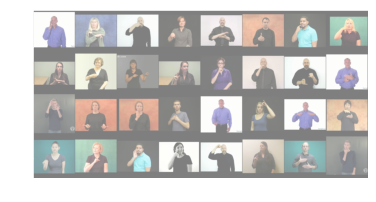

Predictions for batch 37 
['mother', 'hat', 'pizza', 'can', 'paper', 'fish', 'candy', 'bowling', 'cook', 'white', 'go', 'dog', 'who', 'orange', 'last', 'fine', 'decide', 'now', 'brown', 'thin', 'bowling', 'cow', 'clothes', 'chair', 'purple', 'thanksgiving', 'brown', 'family', 'cow', 'clothes', 'enjoy', 'wrong']
Ground truth for batch 37
['mother', 'cheat', 'pizza', 'yes', 'paper', 'fish', 'candy', 'hearing', 'cook', 'white', 'go', 'no', 'who', 'orange', 'last', 'fine', 'decide', 'now', 'brown', 'jacket', 'bowling', 'cow', 'clothes', 'study', 'purple', 'thanksgiving', 'brown', 'cool', 'cow', 'no', 'enjoy', 'wrong']
---------------------------------


Images for 38


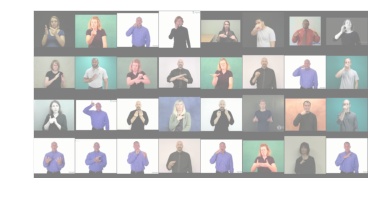

Predictions for batch 38 
['paint', 'tell', 'corn', 'thin', 'walk', 'yes', 'language', 'drink', 'paper', 'woman', 'work', 'paper', 'like', 'no', 'corn', 'no', 'how', 'tall', 'family', 'birthday', 'secretary', 'clothes', 'need', 'mother', 'want', 'graduate', 'kiss', 'dog', 'hot', 'before', 'deaf', 'woman']
Ground truth for batch 38
['paint', 'tell', 'corn', 'cool', 'walk', 'yes', 'language', 'drink', 'city', 'woman', 'work', 'paper', 'like', 'no', 'apple', 'bird', 'how', 'cow', 'family', 'birthday', 'secretary', 'clothes', 'hearing', 'eat', 'many', 'graduate', 'kiss', 'dog', 'hot', 'before', 'fine', 'woman']
---------------------------------


Images for 39


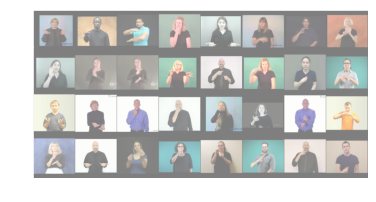

Predictions for batch 39 
['language', 'give', 'table', 'no', 'now', 'last', 'shirt', 'letter', 'deaf', 'right', 'paper', 'decide', 'letter', 'thursday', 'white', 'cool', 'want', 'give', 'candy', 'eat', 'bird', 'jacket', 'change', 'chair', 'paper', 'now', 'kiss', 'orange', 'meet', 'candy', 'woman', 'white']
Ground truth for batch 39
['now', 'give', 'table', 'wrong', 'now', 'hot', 'shirt', 'later', 'brown', 'right', 'paper', 'decide', 'letter', 'thursday', 'white', 'cheat', 'want', 'give', 'candy', 'thin', 'bird', 'jacket', 'change', 'chair', 'paper', 'now', 'give', 'orange', 'letter', 'fine', 'hearing', 'white']
---------------------------------


Images for 40


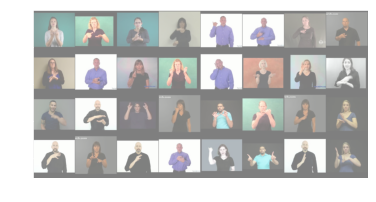

Predictions for batch 40 
['family', 'walk', 'graduate', 'son', 'last', 'birthday', 'woman', 'birthday', 'book', 'birthday', 'dog', 'drink', 'bed', 'language', 'deaf', 'secretary', 'man', 'paper', 'basketball', 'who', 'dark', 'dark', 'man', 'paper', 'woman', 'chair', 'thanksgiving', 'secretary', 'forget', 'but', 'mother', 'paint']
Ground truth for batch 40
['family', 'walk', 'graduate', 'son', 'before', 'birthday', 'woman', 'like', 'paper', 'graduate', 'dog', 'change', 'bed', 'language', 'africa', 'secretary', 'man', 'paper', 'basketball', 'pizza', 'dark', 'thin', 'fine', 'paper', 'woman', 'letter', 'thanksgiving', 'secretary', 'forget', 'but', 'fine', 'paint']
---------------------------------


Images for 41


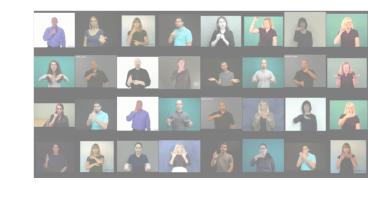

Predictions for batch 41 
['tell', 'bowling', 'jacket', 'pink', 'how', 'tall', 'hearing', 'deaf', 'walk', 'hot', 'fish', 'deaf', 'what', 'can', 'last', 'what', 'eat', 'meet', 'brown', 'language', 'shirt', 'decide', 'enjoy', 'fish', 'blue', 'clothes', 'can', 'computer', 'later', 'hearing', 'dark', 'secretary']
Ground truth for batch 41
['tell', 'bowling', 'jacket', 'pink', 'how', 'tall', 'hearing', 'deaf', 'walk', 'hot', 'fish', 'deaf', 'what', 'can', 'last', 'what', 'drink', 'right', 'brown', 'language', 'shirt', 'decide', 'full', 'fish', 'blue', 'clothes', 'can', 'computer', 'later', 'hearing', 'dark', 'secretary']
---------------------------------


Images for 42


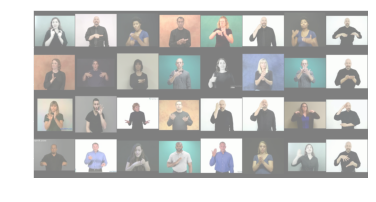

Predictions for batch 42 
['change', 'full', 'what', 'graduate', 'medicine', 'candy', 'enjoy', 'walk', 'fine', 'clothes', 'school', 'birthday', 'fish', 'work', 'dark', 'cook', 'book', 'color', 'walk', 'what', 'forget', 'pizza', 'jacket', 'son', 'can', 'thursday', 'fish', 'woman', 'last', 'book', 'drink', 'study']
Ground truth for batch 42
['change', 'same', 'what', 'graduate', 'later', 'candy', 'enjoy', 'walk', 'fine', 'clothes', 'school', 'birthday', 'fish', 'right', 'dark', 'cook', 'book', 'mother', 'what', 'what', 'black', 'drink', 'jacket', 'son', 'can', 'accident', 'fish', 'woman', 'before', 'book', 'before', 'study']
---------------------------------


Images for 43


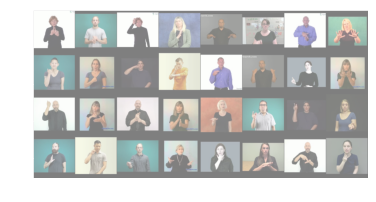

Predictions for batch 43 
['go', 'change', 'no', 'birthday', 'language', 'drink', 'cheat', 'but', 'candy', 'thin', 'apple', 'medicine', 'thursday', 'cool', 'right', 'book', 'forget', 'study', 'year', 'book', 'like', 'dog', 'later', 'bowling', 'man', 'kiss', 'africa', 'right', 'wrong', 'school', 'dance', 'pink']
Ground truth for batch 43
['go', 'change', 'hat', 'fine', 'clothes', 'apple', 'cheat', 'finish', 'candy', 'thin', 'apple', 'computer', 'thursday', 'cool', 'right', 'book', 'forget', 'study', 'right', 'book', 'like', 'dog', 'later', 'bowling', 'man', 'deaf', 'africa', 'what', 'wrong', 'school', 'dance', 'pink']
---------------------------------


Images for 44


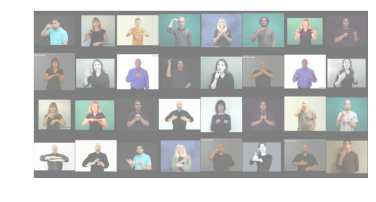

Predictions for batch 44 
['computer', 'thin', 'can', 'black', 'meet', 'corn', 'language', 'walk', 'school', 'man', 'birthday', 'tall', 'who', 'dark', 'can', 'wrong', 'chair', 'walk', 'change', 'purple', 'thanksgiving', 'city', 'kiss', 'help', 'meet', 'computer', 'computer', 'help', 'cow', 'cow', 'fish', 'who']
Ground truth for batch 44
['man', 'school', 'can', 'black', 'all', 'corn', 'language', 'pull', 'school', 'man', 'birthday', 'tall', 'who', 'dark', 'can', 'thanksgiving', 'chair', 'secretary', 'change', 'shirt', 'pull', 'meet', 'bird', 'help', 'table', 'medicine', 'computer', 'full', 'drink', 'help', 'enjoy', 'blue']
---------------------------------


Images for 45


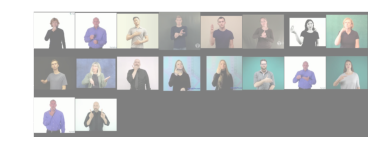

Predictions for batch 45 
['thin', 'year', 'enjoy', 'computer', 'blue', 'fine', 'go', 'hearing', 'africa', 'what', 'mother', 'right', 'blue', 'fish', 'birthday', 'thursday', 'mother', 'but']
Ground truth for batch 45
['thin', 'year', 'enjoy', 'computer', 'blue', 'help', 'go', 'hearing', 'short', 'what', 'wrong', 'right', 'blue', 'fish', 'secretary', 'thursday', 'color', 'but']
---------------------------------


Got 1045 / 1426 with accuracy 73.28


In [37]:
print("Checking accuracy on Training Set")
check_accuracy(train_loader, model)


Checking accuracy on Test Set
Images for 1


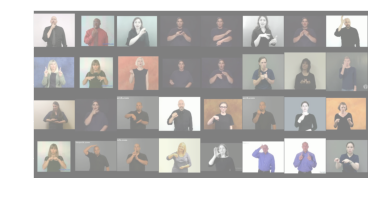

Predictions for batch 1 
['deaf', 'tell', 'computer', 'secretary', 'computer', 'study', 'city', 'computer', 'but', 'clothes', 'dog', 'bowling', 'chair', 'how', 'book', 'white', 'son', 'pink', 'dance', 'yes', 'yes', 'eat', 'wrong', 'pull', 'chair', 'hat', 'medicine', 'yes', 'drink', 'black', 'but', 'time']
Ground truth for batch 1
['who', 'tell', 'computer', 'secretary', 'computer', 'study', 'city', 'computer', 'but', 'clothes', 'dog', 'bowling', 'walk', 'how', 'how', 'white', 'son', 'pink', 'dance', 'yes', 'yes', 'tell', 'give', 'pull', 'chair', 'hat', 'tall', 'yes', 'drink', 'forget', 'but', 'go']
---------------------------------


Images for 2


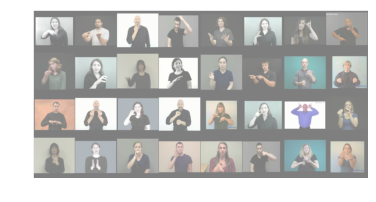

Predictions for batch 2 
['thin', 'cheat', 'color', 'hat', 'many', 'fine', 'cow', 'what', 'give', 'hot', 'black', 'cool', 'like', 'go', 'last', 'can', 'chair', 'family', 'orange', 'work', 'book', 'drink', 'cow', 'letter', 'paper', 'book', 'bird', 'brown', 'school', 'need', 'secretary', 'give']
Ground truth for batch 2
['thin', 'cheat', 'color', 'hat', 'many', 'fine', 'cow', 'what', 'give', 'hot', 'purple', 'cool', 'dog', 'go', 'last', 'can', 'chair', 'family', 'orange', 'work', 'book', 'drink', 'cow', 'kiss', 'year', 'book', 'bird', 'brown', 'like', 'cool', 'secretary', 'give']
---------------------------------


Images for 3


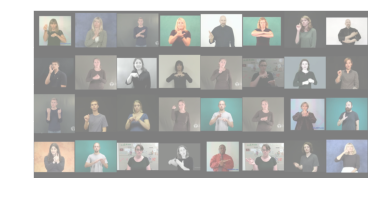

Predictions for batch 3 
['chair', 'school', 'full', 'help', 'right', 'table', 'deaf', 'son', 'kiss', 'school', 'thin', 'chair', 'brown', 'study', 'year', 'dog', 'finish', 'pizza', 'paint', 'black', 'chair', 'school', 'help', 'man', 'meet', 'city', 'candy', 'all', 'full', 'dog', 'africa', 'apple']
Ground truth for batch 3
['chair', 'fine', 'full', 'help', 'right', 'table', 'deaf', 'son', 'mother', 'school', 'thin', 'chair', 'brown', 'study', 'year', 'no', 'many', 'pizza', 'chair', 'black', 'chair', 'cook', 'help', 'man', 'meet', 'city', 'candy', 'all', 'full', 'dog', 'africa', 'apple']
---------------------------------


Images for 4


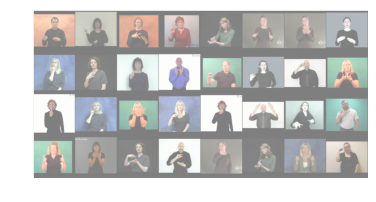

Predictions for batch 4 
['fish', 'basketball', 'cheat', 'right', 'graduate', 'play', 'book', 'tall', 'wrong', 'white', 'who', 'meet', 'bowling', 'short', 'decide', 'how', 'pink', 'candy', 'family', 'need', 'thin', 'dark', 'walk', 'bed', 'many', 'family', 'dance', 'graduate', 'orange', 'graduate', 'play', 'black']
Ground truth for batch 4
['short', 'birthday', 'cheat', 'right', 'graduate', 'play', 'book', 'give', 'wrong', 'white', 'thursday', 'family', 'short', 'short', 'decide', 'how', 'pink', 'candy', 'family', 'need', 'thin', 'dark', 'walk', 'bed', 'play', 'family', 'dance', 'graduate', 'orange', 'graduate', 'play', 'black']
---------------------------------


Images for 5


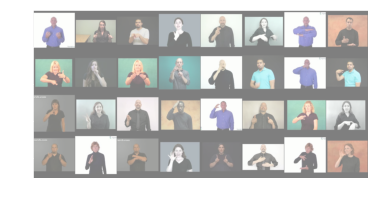

Predictions for batch 5 
['many', 'now', 'work', 'candy', 'pizza', 'walk', 'son', 'cook', 'all', 'bird', 'but', 'deaf', 'mother', 'thin', 'drink', 'computer', 'man', 'many', 'dog', 'cow', 'cousin', 'no', 'clothes', 'secretary', 'cook', 'blue', 'cheat', 'mother', 'language', 'enjoy', 'clothes', 'drink']
Ground truth for batch 5
['many', 'play', 'same', 'candy', 'pizza', 'walk', 'table', 'cook', 'fine', 'bird', 'give', 'letter', 'man', 'thin', 'drink', 'purple', 'man', 'africa', 'blue', 'hat', 'cousin', 'play', 'shirt', 'time', 'cook', 'blue', 'cheat', 'mother', 'but', 'enjoy', 'study', 'drink']
---------------------------------


Images for 6


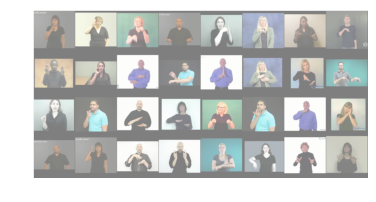

Predictions for batch 6 
['man', 'apple', 'last', 'now', 'deaf', 'thanksgiving', 'want', 'thanksgiving', 'cow', 'drink', 'full', 'computer', 'meet', 'cool', 'dance', 'enjoy', 'like', 'candy', 'cook', 'cook', 'decide', 'eat', 'corn', 'book', 'dog', 'cousin', 'doctor', 'meet', 'son', 'bowling', 'basketball', 'finish']
Ground truth for batch 6
['mother', 'brown', 'last', 'now', 'paint', 'thanksgiving', 'want', 'thanksgiving', 'dark', 'drink', 'son', 'computer', 'tall', 'enjoy', 'dance', 'go', 'no', 'candy', 'cook', 'cook', 'can', 'color', 'man', 'bed', 'dog', 'cousin', 'study', 'meet', 'son', 'bowling', 'basketball', 'finish']
---------------------------------


Images for 7


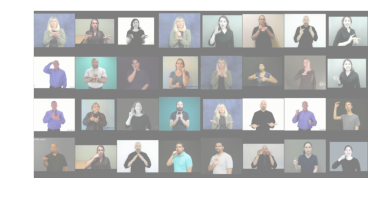

Predictions for batch 7 
['cook', 'language', 'language', 'help', 'woman', 'last', 'city', 'like', 'cousin', 'year', 'bed', 'last', 'letter', 'pull', 'fine', 'need', 'kiss', 'how', 'but', 'meet', 'what', 'now', 'play', 'tall', 'fish', 'candy', 'city', 'corn', 'pizza', 'many', 'no', 'candy']
Ground truth for batch 7
['cook', 'language', 'language', 'help', 'woman', 'last', 'secretary', 'medicine', 'black', 'work', 'bed', 'last', 'letter', 'walk', 'fine', 'need', 'what', 'how', 'but', 'meet', 'what', 'now', 'play', 'tall', 'like', 'apple', 'city', 'corn', 'cool', 'decide', 'no', 'candy']
---------------------------------


Images for 8


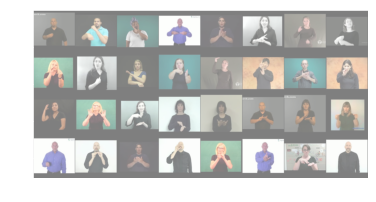

Predictions for batch 8 
['birthday', 'year', 'apple', 'give', 'family', 'secretary', 'thin', 'year', 'kiss', 'tell', 'full', 'study', 'tall', 'dark', 'all', 'no', 'cousin', 'computer', 'cook', 'doctor', 'book', 'secretary', 'paper', 'book', 'bowling', 'thanksgiving', 'all', 'drink', 'accident', 'letter', 'dance', 'bird']
Ground truth for batch 8
['white', 'year', 'bed', 'give', 'school', 'secretary', 'time', 'year', 'kiss', 'tell', 'full', 'study', 'tall', 'tall', 'dark', 'no', 'cousin', 'computer', 'dance', 'doctor', 'book', 'secretary', 'paper', 'book', 'need', 'kiss', 'all', 'drink', 'change', 'help', 'dance', 'bird']
---------------------------------


Images for 9


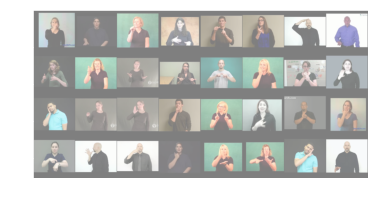

Predictions for batch 9 
['africa', 'short', 'yes', 'walk', 'deaf', 'pink', 'computer', 'bowling', 'play', 'pizza', 'now', 'now', 'but', 'eat', 'year', 'cousin', 'bed', 'short', 'drink', 'who', 'but', 'like', 'help', 'wrong', 'time', 'mother', 'full', 'candy', 'graduate', 'all', 'bed', 'africa']
Ground truth for batch 9
['africa', 'short', 'yes', 'walk', 'letter', 'pink', 'hat', 'bowling', 'play', 'pizza', 'what', 'now', 'but', 'eat', 'year', 'cousin', 'bed', 'short', 'drink', 'orange', 'but', 'like', 'change', 'wrong', 'time', 'mother', 'hearing', 'candy', 'graduate', 'all', 'bed', 'africa']
---------------------------------


Images for 10


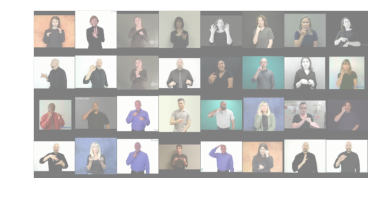

Predictions for batch 10 
['family', 'change', 'who', 'letter', 'dark', 'who', 'pizza', 'time', 'mother', 'pizza', 'work', 'can', 'like', 'deaf', 'time', 'mother', 'kiss', 'apple', 'letter', 'enjoy', 'city', 'birthday', 'doctor', 'apple', 'study', 'want', 'thursday', 'language', 'hat', 'thin', 'fine', 'hot']
Ground truth for batch 10
['decide', 'before', 'year', 'letter', 'dark', 'who', 'pizza', 'time', 'mother', 'yes', 'work', 'can', 'like', 'deaf', 'same', 'candy', 'kiss', 'candy', 'letter', 'like', 'apple', 'kiss', 'doctor', 'brown', 'study', 'want', 'tell', 'language', 'hat', 'thin', 'fine', 'hot']
---------------------------------


Images for 11


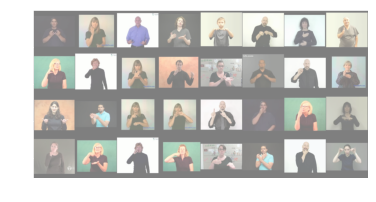

Predictions for batch 11 
['family', 'book', 'thursday', 'now', 'shirt', 'pull', 'enjoy', 'fish', 'cousin', 'full', 'book', 'corn', 'medicine', 'city', 'pizza', 'fish', 'now', 'language', 'chair', 'chair', 'go', 'eat', 'eat', 'chair', 'who', 'dance', 'drink', 'apple', 'now', 'dark', 'wrong', 'cow']
Ground truth for batch 11
['family', 'book', 'now', 'cook', 'many', 'pull', 'enjoy', 'fish', 'cousin', 'bird', 'book', 'corn', 'medicine', 'city', 'no', 'fish', 'now', 'language', 'chair', 'chair', 'go', 'eat', 'blue', 'chair', 'who', 'dance', 'drink', 'apple', 'walk', 'dark', 'wrong', 'cow']
---------------------------------


Images for 12


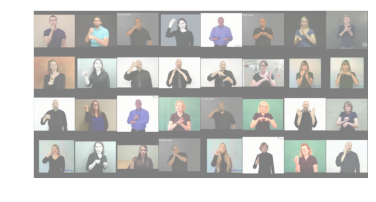

Predictions for batch 12 
['orange', 'last', 'corn', 'cousin', 'want', 'same', 'paper', 'medicine', 'work', 'later', 'forget', 'city', 'study', 'computer', 'book', 'chair', 'need', 'purple', 'give', 'paper', 'apple', 'chair', 'many', 'graduate', 'man', 'work', 'tall', 'bed', 'deaf', 'right', 'before', 'wrong']
Ground truth for batch 12
['orange', 'year', 'corn', 'cousin', 'want', 'same', 'paper', 'medicine', 'work', 'later', 'forget', 'city', 'study', 'paint', 'book', 'chair', 'need', 'forget', 'work', 'school', 'apple', 'chair', 'many', 'work', 'man', 'pull', 'yes', 'bed', 'thursday', 'right', 'before', 'kiss']
---------------------------------


Images for 13


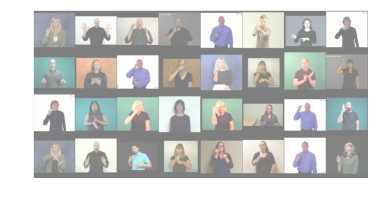

Predictions for batch 13 
['no', 'finish', 'decide', 'brown', 'medicine', 'cheat', 'go', 'drink', 'language', 'all', 'son', 'cow', 'dog', 'chair', 'medicine', 'cousin', 'deaf', 'doctor', 'corn', 'wrong', 'black', 'finish', 'last', 'mother', 'dance', 'basketball', 'computer', 'table', 'last', 'woman', 'no', 'finish']
Ground truth for batch 13
['no', 'finish', 'decide', 'brown', 'like', 'help', 'go', 'drink', 'language', 'all', 'son', 'corn', 'dog', 'chair', 'medicine', 'cousin', 'deaf', 'doctor', 'cool', 'wrong', 'black', 'finish', 'before', 'mother', 'dance', 'basketball', 'enjoy', 'table', 'last', 'woman', 'no', 'finish']
---------------------------------


Images for 14


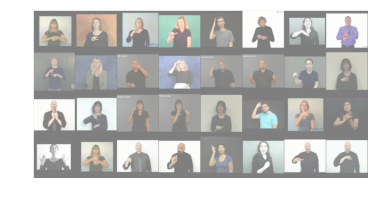

Predictions for batch 14 
['table', 'thanksgiving', 'fine', 'same', 'hat', 'short', 'full', 'computer', 'chair', 'mother', 'thin', 'cow', 'forget', 'language', 'yes', 'pink', 'candy', 'before', 'cousin', 'kiss', 'hot', 'computer', 'mother', 'medicine', 'cool', 'table', 'need', 'but', 'hot', 'white', 'bowling', 'thanksgiving']
Ground truth for batch 14
['table', 'thanksgiving', 'fine', 'same', 'hat', 'short', 'full', 'computer', 'chair', 'mother', 'thin', 'cow', 'forget', 'language', 'yes', 'like', 'meet', 'dance', 'cousin', 'kiss', 'hot', 'computer', 'mother', 'medicine', 'cool', 'table', 'need', 'but', 'later', 'white', 'bowling', 'thanksgiving']
---------------------------------


Images for 15


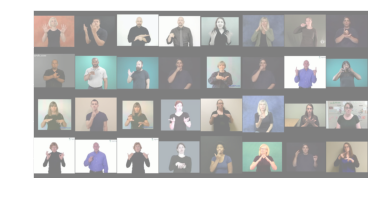

Predictions for batch 15 
['man', 'paint', 'full', 'need', 'many', 'city', 'candy', 'help', 'graduate', 'yes', 'man', 'who', 'cook', 'corn', 'meet', 'corn', 'clothes', 'deaf', 'clothes', 'want', 'clothes', 'tell', 'book', 'drink', 'but', 'short', 'but', 'book', 'candy', 'decide', 'decide', 'chair']
Ground truth for batch 15
['finish', 'family', 'full', 'need', 'many', 'city', 'candy', 'help', 'graduate', 'yes', 'man', 'who', 'cook', 'corn', 'meet', 'corn', 'clothes', 'deaf', 'book', 'want', 'clothes', 'tell', 'book', 'drink', 'decide', 'pizza', 'cool', 'book', 'candy', 'city', 'decide', 'chair']
---------------------------------


Images for 16


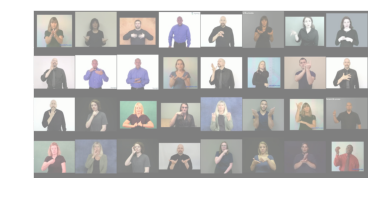

Predictions for batch 16 
['book', 'now', 'clothes', 'bowling', 'full', 'want', 'purple', 'short', 'brown', 'letter', 'school', 'how', 'mother', 'before', 'meet', 'like', 'color', 'pink', 'chair', 'hearing', 'later', 'family', 'table', 'right', 'white', 'drink', 'corn', 'study', 'corn', 'letter', 'paper', 'go']
Ground truth for batch 16
['book', 'now', 'clothes', 'bowling', 'hot', 'want', 'purple', 'short', 'brown', 'letter', 'school', 'want', 'mother', 'cheat', 'meet', 'like', 'color', 'africa', 'jacket', 'hearing', 'many', 'family', 'table', 'right', 'white', 'drink', 'drink', 'want', 'corn', 'letter', 'paper', 'go']
---------------------------------


Images for 17


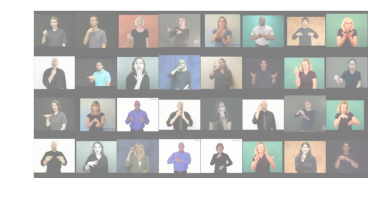

Predictions for batch 17 
['africa', 'thin', 'now', 'go', 'paper', 'before', 'clothes', 'book', 'wrong', 'language', 'color', 'corn', 'clothes', 'want', 'before', 'purple', 'accident', 'doctor', 'play', 'later', 'eat', 'black', 'dance', 'walk', 'give', 'woman', 'cousin', 'cheat', 'time', 'thanksgiving', 'pink', 'cheat']
Ground truth for batch 17
['need', 'thin', 'pizza', 'go', 'paper', 'before', 'shirt', 'book', 'who', 'same', 'color', 'corn', 'cousin', 'want', 'before', 'purple', 'same', 'doctor', 'play', 'later', 'eat', 'black', 'dance', 'study', 'give', 'woman', 'cousin', 'cheat', 'time', 'thanksgiving', 'pink', 'cheat']
---------------------------------


Images for 18


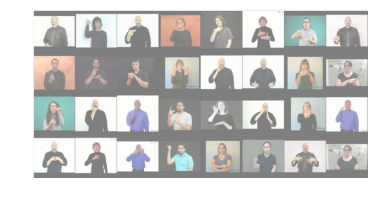

Predictions for batch 18 
['like', 'forget', 'thursday', 'bird', 'no', 'but', 'decide', 'need', 'man', 'graduate', 'change', 'family', 'brown', 'can', 'book', 'enjoy', 'thin', 'drink', 'finish', 'letter', 'drink', 'paint', 'color', 'cousin', 'change', 'full', 'dark', 'computer', 'son', 'blue', 'clothes', 'now']
Ground truth for batch 18
['like', 'forget', 'thursday', 'bird', 'thin', 'before', 'dance', 'give', 'tell', 'graduate', 'change', 'family', 'brown', 'can', 'book', 'school', 'thin', 'wrong', 'finish', 'letter', 'drink', 'paint', 'all', 'cousin', 'same', 'thanksgiving', 'dark', 'forget', 'son', 'blue', 'clothes', 'now']
---------------------------------


Images for 19


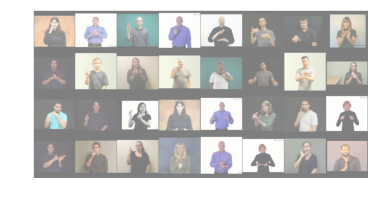

Predictions for batch 19 
['mother', 'change', 'blue', 'tell', 'school', 'before', 'white', 'book', 'how', 'all', 'family', 'cool', 'apple', 'pizza', 'work', 'year', 'last', 'need', 'meet', 'want', 'decide', 'graduate', 'deaf', 'short', 'paint', 'who', 'shirt', 'woman', 'medicine', 'walk', 'bird', 'cool']
Ground truth for batch 19
['mother', 'change', 'blue', 'tell', 'school', 'before', 'hot', 'book', 'how', 'all', 'family', 'dog', 'apple', 'can', 'work', 'year', 'last', 'need', 'go', 'want', 'decide', 'graduate', 'deaf', 'shirt', 'paint', 'who', 'shirt', 'who', 'medicine', 'walk', 'drink', 'cool']
---------------------------------


Images for 20


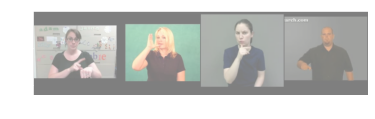

Predictions for batch 20 
['time', 'drink', 'who', 'short']
Ground truth for batch 20
['time', 'drink', 'who', 'short']
---------------------------------


Got 448 / 612 with accuracy 73.20


In [38]:
print("Checking accuracy on Test Set")
check_accuracy(test_loader, model)